<img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<br>
<b>DECam HiTS Analysis Notebook</b> <br>
Contact author: Erin Howard<br>
Last verified to run: December 2, 2022<br>
LSST Science Piplines version: w_2022_46<br>
Container Size: Large <br>

# DM-35284: ApPipeWithFakes on DECam HiTS, November 2022

New baseline run, using "new diffim" (after the big refactor), default convolve mode.

* Uses `decam_rings_v1` skymap
* Templates from HiTS 2014 are in `/sdf/group/rubin/repo/main/u/elhoward/DM-36024/templates`
* Final processing of HiTS 2015 is in `u/elhoward/DM-35284/hits2015-fakes`
* Postgres schema is `elhoward_dm35284_hits_appipewithfakes`
* Working directory on USDF with bps logs, pipelines, etc. is `/project/elhoward/repo-main-logs/DM-35284`

For ApPipeWithFakes.yaml:
```
inCollection: DECam/defaults/hits2015,u/mrawls/DM-34710-hits-crosstalk-sources,u/mrawls/DM-34710/templates
dataQuery: "instrument='DECam' AND skymap='decam_rings_v1' AND detector NOT IN (2, 61) AND exposure>400000"
```

Notes: The exposure cuts are necessary to force each pipeline to use only the 2014 images (numbered in the 200000s) for template building, and to use only the 2015 images (numbered in the 400000s) as science images.

## Table of Contents

1. Loading DiaObjects and DiaSources
2. Typical "quick look analysis" plots
3. Separating the fake sources from the real sources
4. Fakes completeness analysis
5. SNR distributions

In [1]:
%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd
import astropy.units as u

import lsst.daf.butler as dafButler
from lsst.analysis.ap import legacyApdbUtils as utils
from lsst.analysis.ap import legacyPlotUtils as plac

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

importlib.reload(utils)

Overriding default configuration file with /opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-4.1.0/Linux64/dustmaps_cachedata/g41a3ec361e+62d12e78cb/config/.dustmapsrc


<module 'lsst.analysis.ap.legacyApdbUtils' from '/sdf/data/rubin/u/elhoward/repos/analysis_ap/python/lsst/analysis/ap/legacyApdbUtils.py'>

## 1. Loading DiaObjects and DiaSources

In [2]:
repo = '/repo/main'
butler = dafButler.Butler(repo)
collections = 'u/elhoward/DM-35284/hits2015-fakes' #payloadName from bps yaml
instrument = 'DECam'
skymap = 'decam_rings_v1'
schema = 'elhoward_dm35284_hits_appipewithfakes'

dbType='postgres'
dbName='lsst-devl'

month = 'November'
year = '2022'

# Load a previous reprocessing for comparison
collections_old = 'u/elhoward/DM-36024/hits2015-fakes-postgresTest'
schema_old = 'elhoward_dm36024_hits_appipewithfakes'
month_old = 'October'
year_old = '2022'

In [3]:
objTable, srcTable, goodObj, goodSrc = utils.loadTables(repo,
                                                      dbName=dbName,
                                                      dbType=dbType,
                                                      instrument=instrument,
                                                      schema=schema)

In [4]:
flagTable, srcTableFlags, flagFilter, goodSrc, goodObj = utils.makeSrcTableFlags(srcTable, objTable,
                                                                               instrument=instrument,
                                                                               repo=repo)

In [5]:
objTable_old, srcTable_old, goodObj_old, goodSrc_old = utils.loadTables(repo,
                                                      dbName=dbName,
                                                      dbType=dbType,
                                                      instrument=instrument,
                                                      schema=schema_old)

In [6]:
flagTable_old, srcTableFlags_old, flagFilter_old, goodSrc_old, goodObj_old = utils.makeSrcTableFlags(srcTable_old, objTable_old,
                                                                               instrument=instrument,
                                                                               repo=repo)

## 2. Typical "quick look analysis" plots

Including a visual comparison of an older Dec 2021 processing run

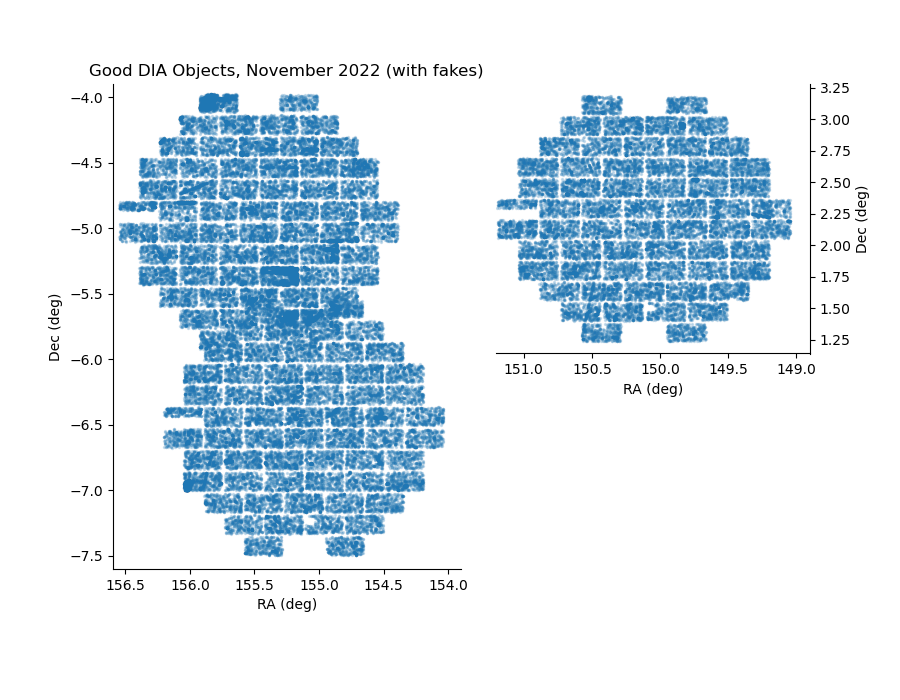

In [7]:
hitsPlot = plac.plotHitsSourcesOnSky(goodObj, title=f'Good DIA Objects, {month} {year} (with fakes)')

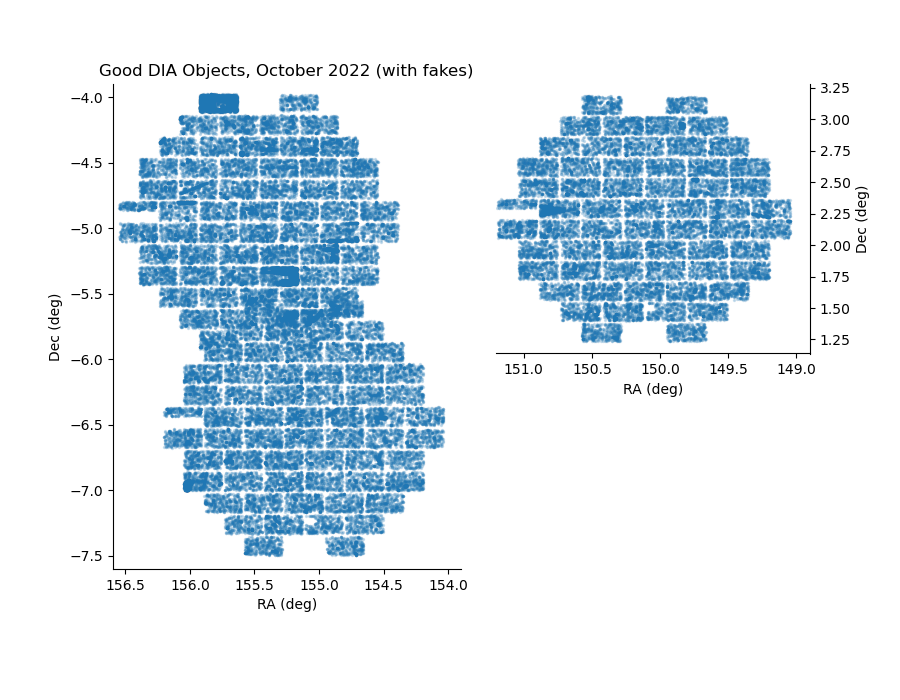

In [8]:
hitsPlot_old = plac.plotHitsSourcesOnSky(goodObj_old, title=f'Good DIA Objects, {month_old} {year_old} (with fakes)')

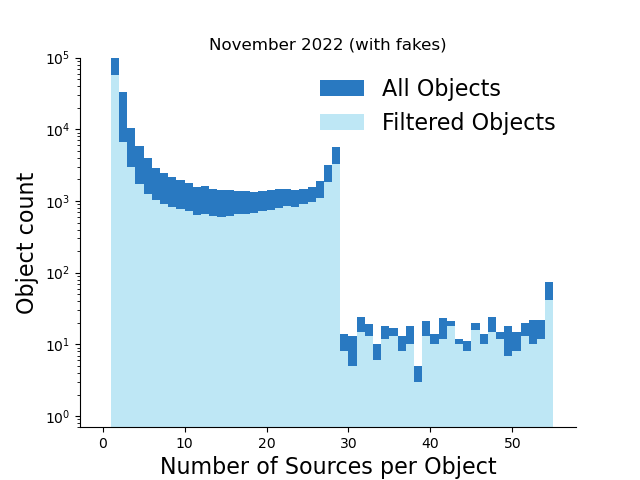

In [9]:
hist = plac.plotDiaObjectHistogram(objTable, goodObj, title=f'{month} {year} (with fakes)')

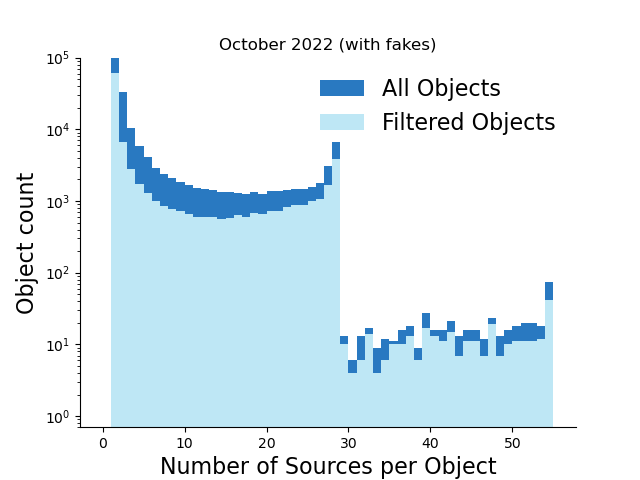

In [10]:
hist_old = plac.plotDiaObjectHistogram(objTable_old, goodObj_old, title=f'{month_old} {year_old} (with fakes)')


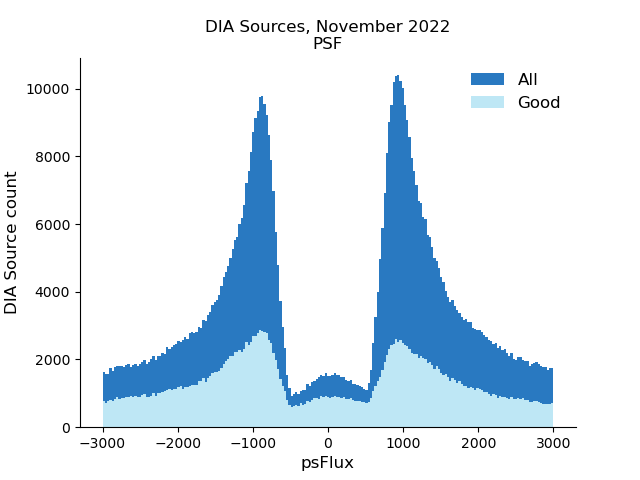

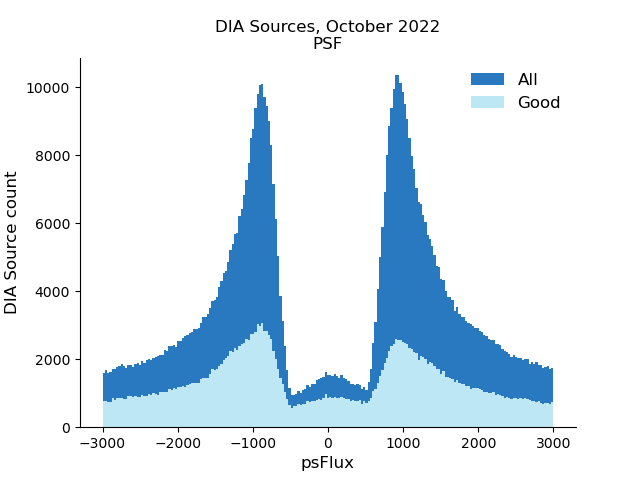

In [11]:
plac.plotFluxHistSrc(srcTable, goodSrc, fluxType='psFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month} {year}\nPSF')
plac.plotFluxHistSrc(srcTable_old, goodSrc_old, fluxType='psFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month_old} {year_old}\nPSF')

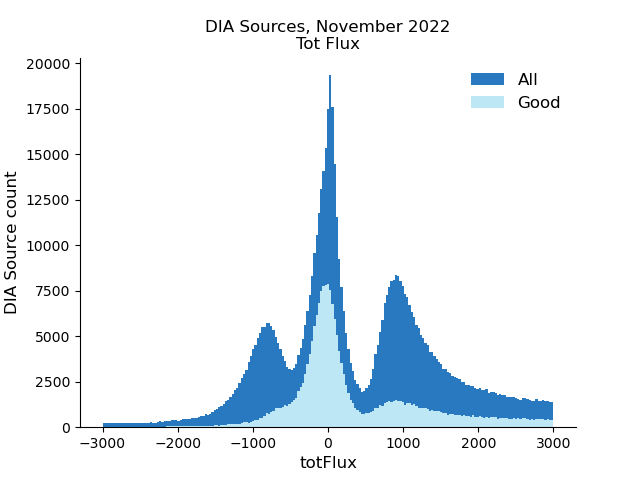

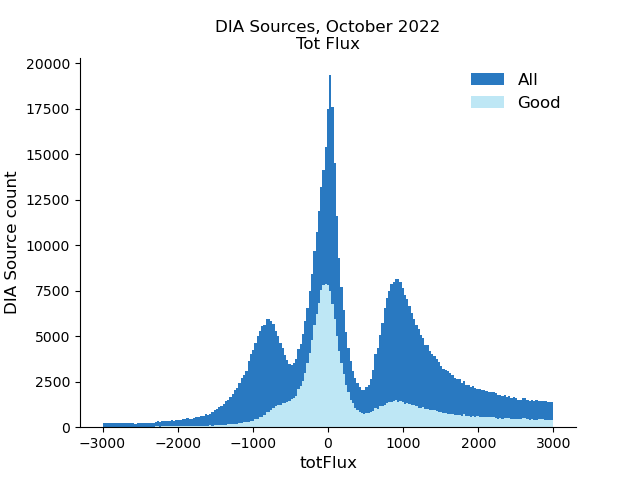

In [12]:
plac.plotFluxHistSrc(srcTable, goodSrc, fluxType='totFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month} {year}\nTot Flux')
plac.plotFluxHistSrc(srcTable_old, goodSrc_old, fluxType='totFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month_old} {year_old}\nTot Flux')

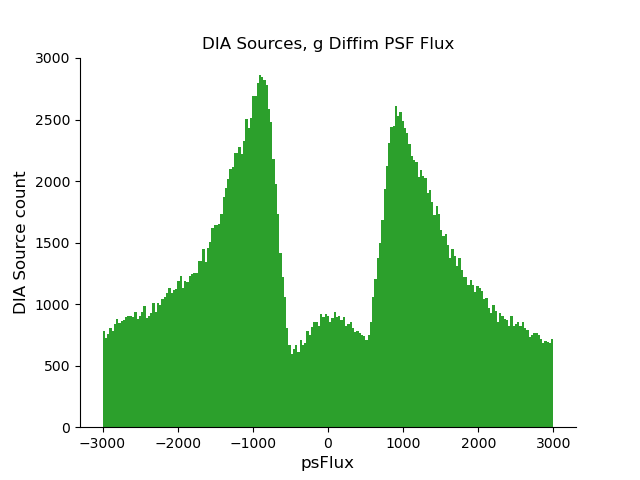

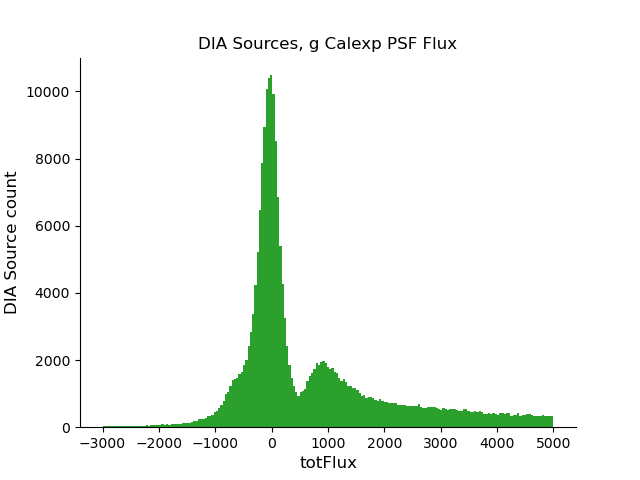

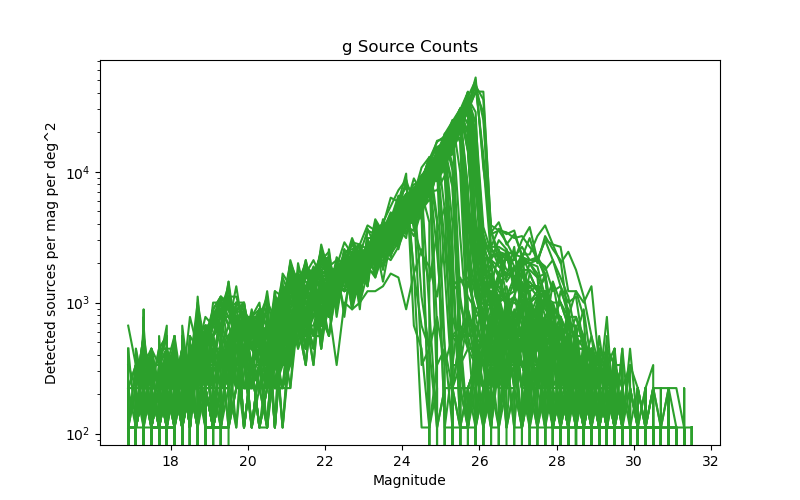

In [13]:
bandList = ['g']
colorList = ['C2']
collection = collections

for band, color in zip(bandList, colorList):
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='psFlux',
                        title=f'DIA Sources, {band} Diffim PSF Flux', color1=color, binmin=-3e3, binmax=3e3)
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='totFlux',
                        title=f'DIA Sources, {band} Calexp PSF Flux', color1=color, binmin=-3e3, binmax=5e3)
    plac.source_magnitude_histogram(repo, goodSrc, band, 'DECam', collection)

In [14]:
def spatial_flag_plot(df, df2, flagName1, flagName2=None, operator=None, plotFlagged=True, 
                      plotUnFlagged=True, title='', title2=''):
    if flagName2 and operator:
        if operator == 'or':
            flagFilter = ((df[flagName1]) | (df[flagName2]))
            labelTrue = flagName1 + ' \nor ' + flagName2
            labelFalse = 'Neither ' + flagName1 + ' \nnor ' + flagName2
            
            flagFilter2 = ((df2[flagName1]) | (df2[flagName2]))
            labelTrue2 = flagName1 + ' \nor ' + flagName2
            labelFalse2 = 'Neither ' + flagName1 + ' \nnor ' + flagName2
        elif operator == 'and':
            flagFilter = ((df[flagName1]) & (df[flagName2]))
            labelTrue = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse = 'Not ' + flagName1 + ' \nand ' + flagName2
            
            flagFilter2 = ((df2[flagName1]) & (df2[flagName2]))
            labelTrue2 = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse2 = 'Not ' + flagName1 + ' \nand ' + flagName2
        else:
            raise ValueError('Operator must be \'and\' or \n \'or\'')
    elif flagName2 and not operator:
        raise ValueError('Operator must be set if a second flag is given')
    else:  # just considering one flag
        flagFilter = (df[flagName1])
        labelTrue = flagName1
        labelFalse = 'No ' + flagName1
        
        flagFilter2 = (df2[flagName1])
        labelTrue2 = flagName1
        labelFalse2 = 'No ' + flagName1
    flagFilterInverse = ~flagFilter
    flagFilterInverse2 = ~flagFilter2
    
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    if plotFlagged:
        scatterFlagged = ax.scatter(df.loc[flagFilter, 'ra'], df.loc[flagFilter, 'decl'], 
                    color='C3', s=5, alpha=0.2, label=labelTrue)
        scatterFlagged = ax2.scatter(df2.loc[flagFilter2, 'ra'], df2.loc[flagFilter2, 'decl'], 
                    color='C3', s=5, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(df.loc[flagFilterInverse, 'ra'], df.loc[flagFilterInverse, 'decl'], 
                    color='C0', s=5, alpha=0.2, label=labelFalse)
        scatterUnflagged = ax2.scatter(df2.loc[flagFilterInverse2, 'ra'], df2.loc[flagFilterInverse2, 'decl'], 
                    color='C0', s=5, alpha=0.2, label=labelFalse)
        
    print(f'--{month} {year}--')
    print('Flagged sources: {0}'.format(len(df.loc[flagFilter, 'ra'])))
    print('Unflagged sources: {0}'.format(len(df.loc[flagFilterInverse, 'ra'])))
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_title(title)
    
    print(f'--{month_old} {year_old}--')
    print('Flagged sources: {0}'.format(len(df2.loc[flagFilter2, 'ra'])))
    print('Unflagged sources: {0}'.format(len(df2.loc[flagFilterInverse2, 'ra'])))
    ax2.set_xlabel('RA (deg)')
    ax2.set_ylabel('Dec (deg)')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.set_title(title2)
    
    xlim = (150.8, 149.8)
    ylim = (2.4, 3.1)
    plt.setp(ax, xlim=xlim, ylim=ylim)
    plt.setp(ax2, xlim=xlim, ylim=ylim)
    plt.suptitle(f'Flagged vs Unflagged Sources (with fakes)')

--November 2022--
Flagged sources: 591300
Unflagged sources: 621205
--October 2022--
Flagged sources: 592456
Unflagged sources: 628110


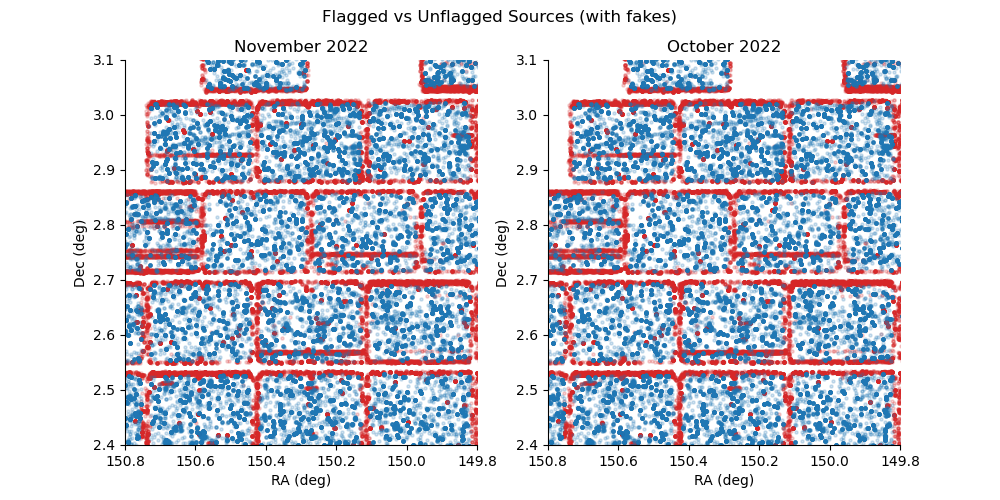

In [15]:
spatial_flag_plot(srcTableFlags, srcTableFlags_old, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or',
                  title=f'{month} {year}', title2=f'{month_old} {year_old}')

Text(0.5, 1.0, 'October 2022 (with fakes)')

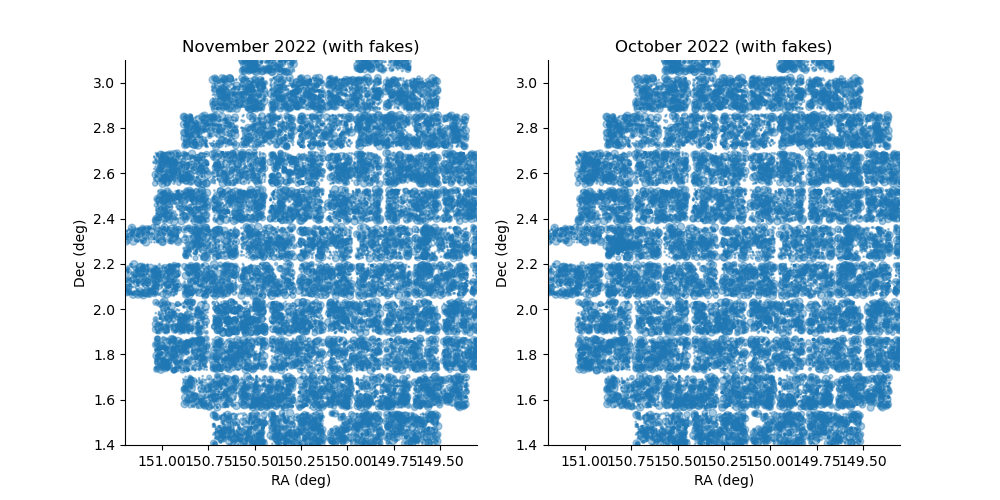

In [16]:
fig = plt.figure(figsize=(10,5))

xlim = (151.2, 149.3)
ylim = (1.4, 3.1)

ax = fig.add_subplot(121)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj['ra'], goodObj['decl'], c='C0', s=goodObj['nDiaSources'], marker='o', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title(f'{month} {year} (with fakes)')

ax2 = fig.add_subplot(122)
plt.setp(ax2, xlim=xlim, ylim=ylim)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.scatter(goodObj_old['ra'], goodObj_old['decl'], c='C0', s=goodObj_old['nDiaSources'], marker='o', alpha=0.4)
ax2.set_xlabel('RA (deg)')
ax2.set_ylabel('Dec (deg)')
ax2.set_title(f'{month_old} {year_old} (with fakes)')

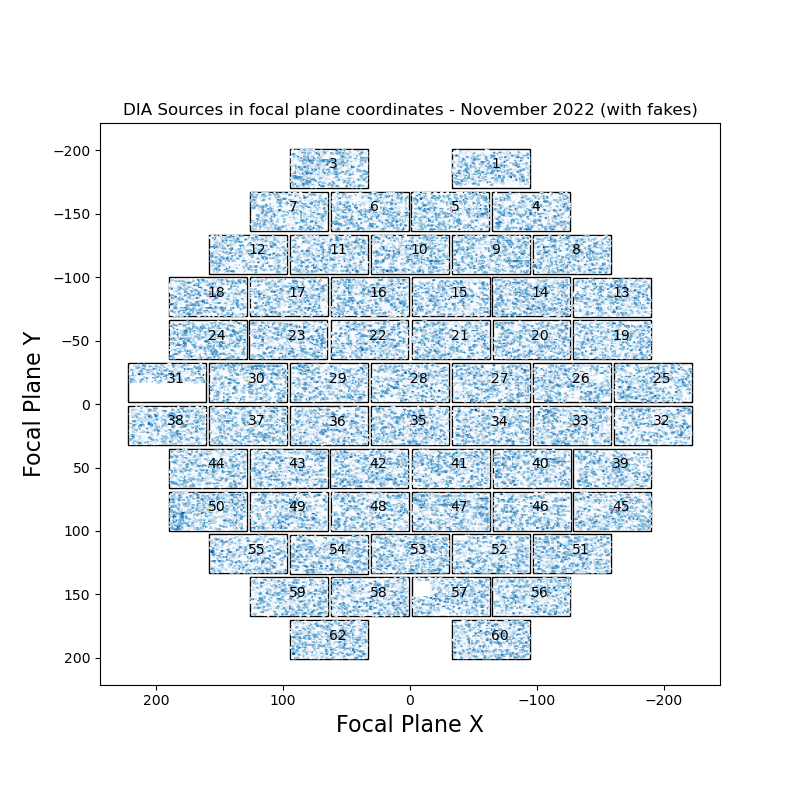

In [17]:
plac.plotDiaSourcesInFocalPlane(repo, goodSrc, title=f'- {month} {year} (with fakes)', instrument='DECam',
                               collections=collections)

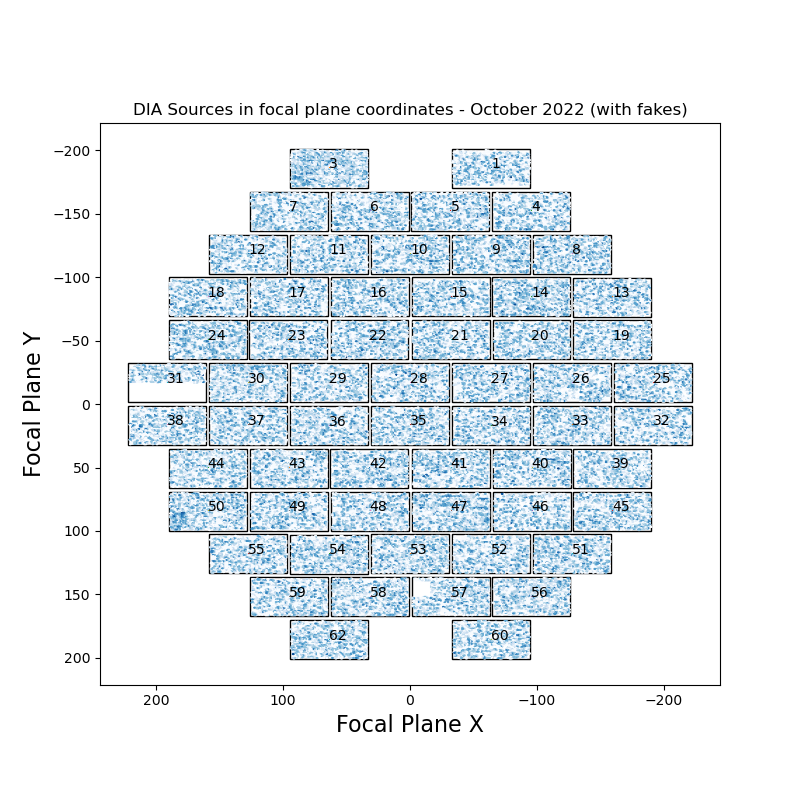

In [18]:
plac.plotDiaSourcesInFocalPlane(repo, goodSrc_old, title=f'- {month_old} {year_old} (with fakes)', instrument='DECam',
                               collections=collections_old)

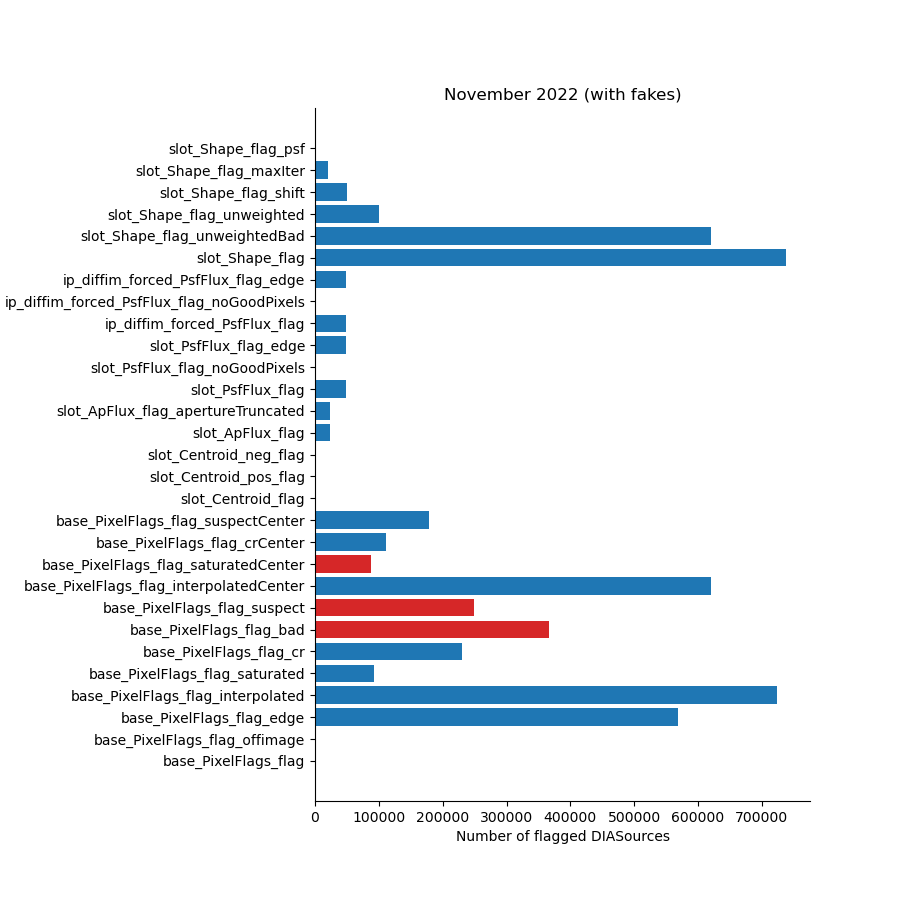

In [19]:
plac.plotFlagHist(srcTable, title=f'{month} {year} (with fakes)')

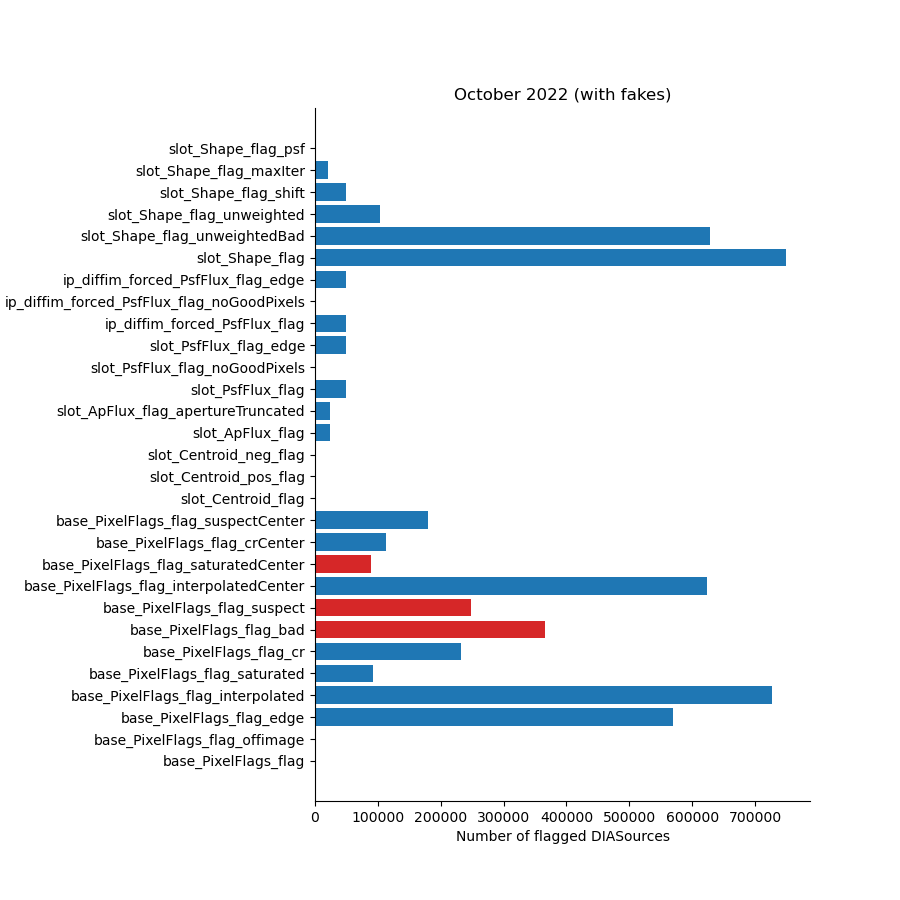

In [20]:
plac.plotFlagHist(srcTable_old, title=f'{month_old} {year_old} (with fakes)')

## 3. Separating the fake sources from the real sources

In [21]:
tractList = [10054, 10055, 10056, 8122, 8123, 8362, 8363, 8364, 8604, 8605,
             8846, 8847, 9570, 9571, 9812, 9813, 9814]

In [22]:
dfs = [butler.get('fakes_fakeSourceCat', collections=collections,
                 instrument=instrument, skymap=skymap, tract=tract) for tract in tractList]
allInjectedFakes = pd.concat(dfs, ignore_index=True)

In [23]:
allInjectedFakes

,fakeId,dec,ra,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,y_mag,disk_semimajor,bulge_semimajor,disk_n,bulge_n,disk_axis_ratio,bulge_axis_ratio,disk_pa,bulge_pa,sourceType
0,9233411508139225629,0.055121,2.603926,True,False,23.034274,23.034274,23.034274,23.034274,23.034274,23.034274,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
1,11351411751404012413,0.061915,2.616994,True,False,20.525169,20.525169,20.525169,20.525169,20.525169,20.525169,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
2,11604334413159322679,0.080659,2.610914,True,False,22.824213,22.824213,22.824213,22.824213,22.824213,22.824213,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
3,13331759464331887140,0.061271,2.594199,True,False,20.098034,20.098034,20.098034,20.098034,20.098034,20.098034,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
4,10060680607772928950,0.074790,2.601716,True,False,24.107792,24.107792,24.107792,24.107792,24.107792,24.107792,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162872,11566096753696071409,0.027589,2.666088,False,True,20.928608,20.928608,20.928608,20.928608,20.928608,20.928608,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
162873,9224905162509628262,0.042351,2.640017,False,True,22.447382,22.447382,22.447382,22.447382,22.447382,22.447382,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
162874,9364714247684657661,0.043082,2.668239,False,True,23.763201,23.763201,23.763201,23.763201,23.763201,23.763201,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
162875,11854290043908386829,0.055073,2.643180,False,True,21.571958,21.571958,21.571958,21.571958,21.571958,21.571958,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star


In [24]:
def collectMatchedDiaSources(fakesMatchDiaSrc, maxi=-1):
    """Given a butler query of fakesMatchDiaSrc datasetRefs, create a pandas dataframe with them all.
    'All' is defined as up to maxi of them, so it doesn't take forever.
    
    If you really want all of them, set maxi to -1.
    """
    #%%time
    visitDetectorFrames = []

    i = 0

    for datasetRef in fakesMatchDiaSrc: 
        try:
            frame = butler.getDirect(datasetRef)
            # nondetected sources don't have DIASource records--so propagate metadata to all rows
            # grab a detected row
            w = frame['diaSourceId'] > 0
            if np.sum(w) == 0:
                print(f'No real sources detected in {datasetRef}')
                continue
            ccdVisitId = int(frame.loc[w,'ccdVisitId'].iloc[0])
            filterName = frame.loc[w,'filterName'].iloc[0]
            # propagate to all rows
            frame.loc[:,'ccdVisitId'] = ccdVisitId 
            frame.loc[:,'filterName'] = filterName 
        except Exception as e:
            raise(e)
        else:
            visitDetectorFrames.append(frame)
        i+=1
        if i == maxi:
            break

    matchedDiaSources = pd.concat(visitDetectorFrames)
    
    matchedDiaSources.loc[:,'ra'] = np.degrees(matchedDiaSources['ra_x'])
    matchedDiaSources.loc[:,'decl'] = np.degrees(matchedDiaSources['dec'])

    return matchedDiaSources

In [25]:
fakesMatchDiaSrc = butler.registry.queryDatasets(collections=collections,
                                                 datasetType='fakes_goodSeeingDiff_matchDiaSrc')
matchedDiaSources = collectMatchedDiaSources(fakesMatchDiaSrc)

In [26]:
instrumentDataId = butler.registry.expandDataId(instrument=instrument)
packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
dataId = packer.unpack(matchedDiaSources.ccdVisitId)
matchedDiaSources['visit'] = dataId['visit']
matchedDiaSources['detector'] = dataId['detector']

In [27]:
matchedDiaSources

,fakeId,dec,ra_x,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,...,totFluxErr,ixx,iyy,ixy,ixxPSF,iyyPSF,ixyPSF,ra,visit,detector
0,11202087236482064271,0.051588,2.627688,True,False,23.830432,24.321511,23.830432,23.830432,23.830432,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.555444,412704,7
1,12580416602975557064,0.050886,2.629943,True,False,20.390529,20.290324,20.390529,20.390529,20.390529,...,336.528412,0.566465,0.575753,0.037982,0.573582,0.019860,0.019860,150.684655,412704,7
2,11997529279546565245,0.051206,2.627244,True,False,20.547086,20.282579,20.547086,20.547086,20.547086,...,336.189460,0.568398,0.555657,0.015784,0.573779,0.019867,0.019867,150.529982,412704,7
3,11748949779885911140,0.051384,2.629470,True,False,20.939435,20.912746,20.939435,20.939435,20.939435,...,339.394684,0.592886,0.533301,-0.004489,0.573559,0.019859,0.019859,150.657550,412704,7
4,9917542028964585970,0.050450,2.630487,True,False,25.349861,25.813952,25.349861,25.349861,25.349861,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.715780,412704,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,11196935513257736920,-0.070861,2.716965,False,True,25.069453,-25.069453,25.069453,25.069453,25.069453,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,155.670624,411037,3
90,10234805915976123450,-0.069791,2.721446,False,True,22.889786,-22.889786,22.889786,22.889786,22.889786,...,183.101249,NaN,NaN,NaN,0.330131,0.003646,0.003646,155.927348,411037,3
91,12163435625431903977,-0.071657,2.719597,False,True,20.727040,-20.727040,20.727040,20.727040,20.727040,...,181.567642,NaN,NaN,NaN,0.329678,0.003641,0.003641,155.821435,411037,3
92,9865022722207229402,-0.070350,2.716768,False,True,20.724918,-20.724918,20.724918,20.724918,20.724918,...,175.869564,NaN,NaN,NaN,0.329784,0.003642,0.003642,155.659343,411037,3


Text(0.5, 1.0, 'DIA Objects, Fakes, and Matched DIA Sources, November 2022')

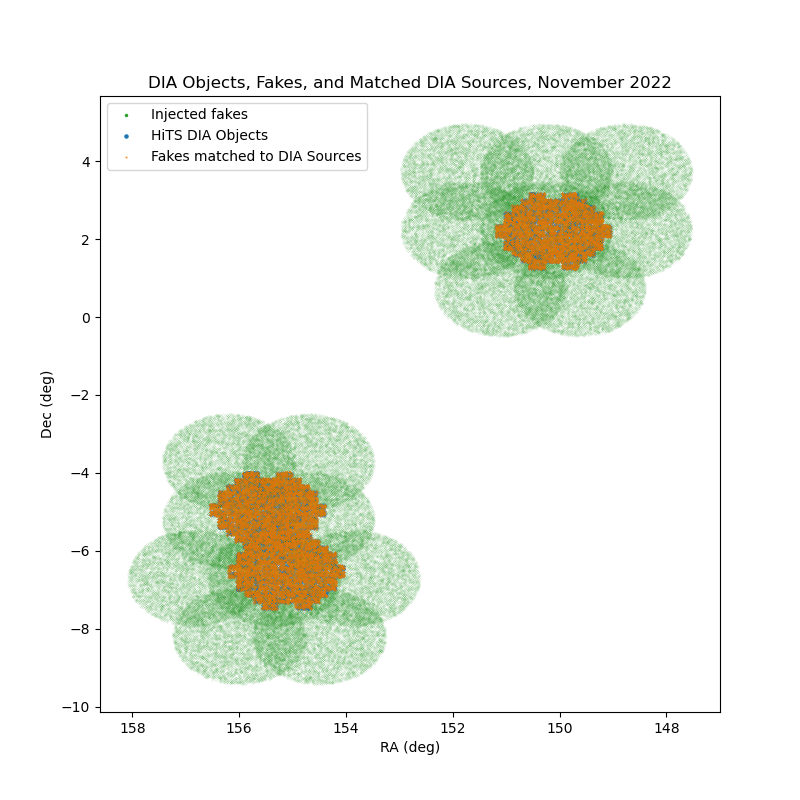

In [28]:
plt.figure(figsize=(8,8))
plt.plot(allInjectedFakes.ra*u.rad.to(u.deg), allInjectedFakes.dec*u.rad.to(u.deg),
         ls='None', marker='.', ms=0.1, label="Injected fakes", color='C2')
plt.plot(goodObj.ra, goodObj.decl, ls='None', marker='.', ms=0.15, label="HiTS DIA Objects", color='C0')
plt.plot(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), ls='None', marker='.',
         ms=0.03, label="Fakes matched to DIA Sources", color='C1')
plt.gca().invert_xaxis()
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")
plt.legend(markerscale=30)
plt.title(f'DIA Objects, Fakes, and Matched DIA Sources, {month} {year}')

In [29]:
nFakesGood = len(matchedDiaSources)
nFakesGood  # number of matched fake sources

451688

In [30]:
len(srcTable) - nFakesGood  # number of non-fake DIA Sources

760817

In [31]:
len(goodSrc)  # number of good sources

461286

visit 410915: 14273 DIA Sources, 5393 matched injected fakes
visit 410929: 17239 DIA Sources, 5362 matched injected fakes
visit 410931: 18014 DIA Sources, 5370 matched injected fakes
visit 410971: 16254 DIA Sources, 5397 matched injected fakes
visit 410985: 16593 DIA Sources, 5371 matched injected fakes
visit 410987: 18542 DIA Sources, 5371 matched injected fakes
visit 411021: 14919 DIA Sources, 5386 matched injected fakes
visit 411035: 16270 DIA Sources, 5376 matched injected fakes
visit 411037: 17162 DIA Sources, 5380 matched injected fakes
visit 411055: 16265 DIA Sources, 5401 matched injected fakes
visit 411069: 17825 DIA Sources, 5382 matched injected fakes
visit 411071: 19535 DIA Sources, 5374 matched injected fakes
visit 411255: 14237 DIA Sources, 5385 matched injected fakes
visit 411269: 17769 DIA Sources, 5377 matched injected fakes
visit 411271: 18869 DIA Sources, 5371 matched injected fakes
visit 411305: 16367 DIA Sources, 5391 matched injected fakes
visit 411319: 18913 DIA 

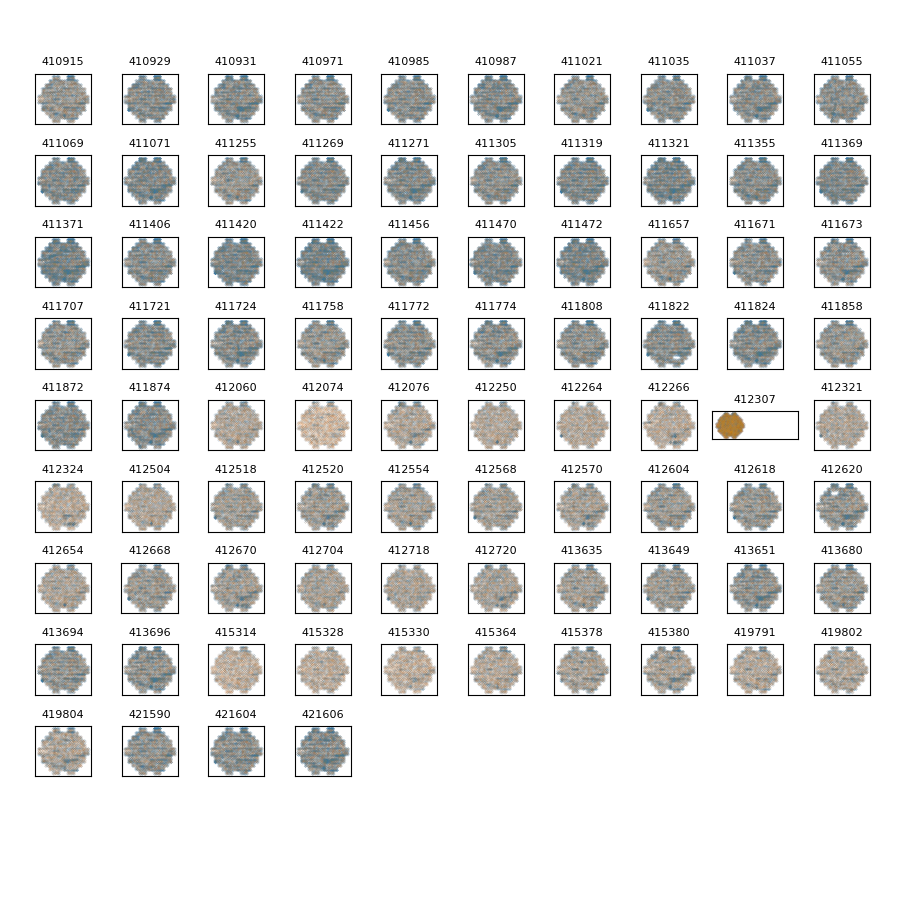

In [32]:
# Plot visit-by-visit: DIA Sources (blue) and inserted fakes (orange)

sourceTablePlot = srcTable
#sourceTablePlot = goodSrc

visits = np.unique(sourceTablePlot['visit'])
nVisits = len(visits)
if np.floor(np.sqrt(nVisits)) - np.sqrt(nVisits) == 0:
    squareGridSize = int(np.sqrt(nVisits))
else:
    squareGridSize = int(np.sqrt(nVisits)) + 1

fig = plt.figure(figsize=(9, 9))
for count, visit in enumerate(np.unique(sourceTablePlot['visit'].values)):
    idx = sourceTablePlot.visit == visit
    ax = fig.add_subplot(squareGridSize, squareGridSize, count + 1, aspect='equal')
    ax.scatter(sourceTablePlot.ra[idx], sourceTablePlot.decl[idx], c='C0', marker='.', s=0.01, alpha=0.3)
    
    fakeSources = matchedDiaSources.loc[matchedDiaSources.visit == visit]
    ax.scatter(fakeSources.ra_x*u.rad.to(u.deg), fakeSources.dec*u.rad.to(u.deg),
               c='C1', marker='.', s=0.01, alpha=0.3)
    
    ax.set_title(visit, size=8)
    ax.invert_xaxis()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    print(f'visit {visit}: {len(sourceTablePlot.loc[sourceTablePlot.visit == visit])} DIA Sources, {len(fakeSources)} matched injected fakes')

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.subplots_adjust(wspace=0)

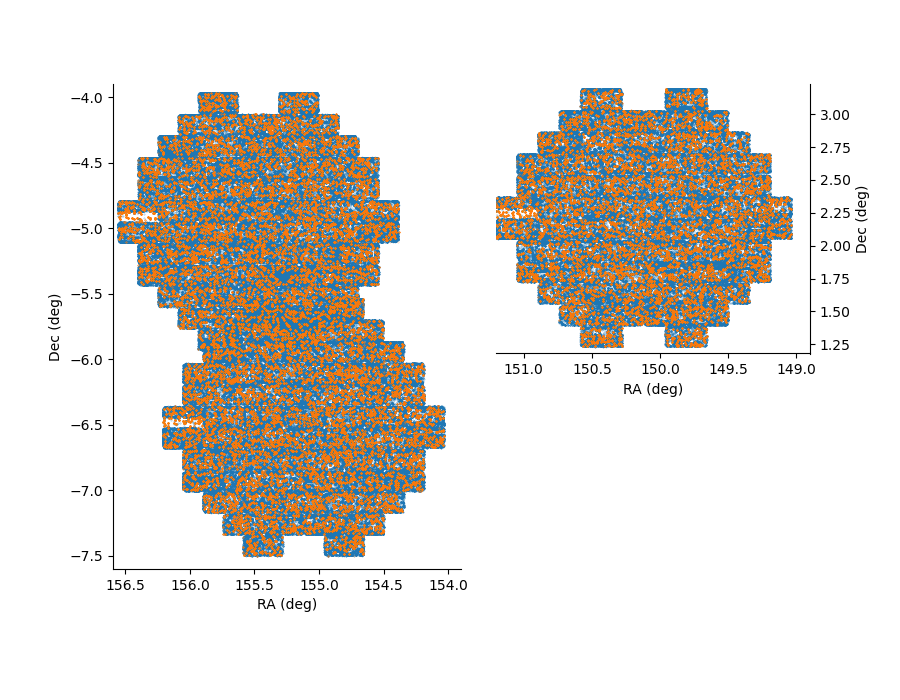

In [33]:
# Same as above but all on top of each other instead of broken out by visit
plt.figure(figsize=(9, 7))
ax1 = plt.subplot2grid((100, 100), (0, 55),
                       rowspan=50, colspan=45)  # 1 single HiTS field, on the right
ax2 = plt.subplot2grid((100, 100), (0, 0),
                       rowspan=90, colspan=50)  # 2 overlapping HiTS fields, on the left

ax1Filter = (srcTable['decl'] > -2)
ax2Filter = (~ax1Filter)

ax1.scatter(srcTable.loc[ax1Filter, 'ra'],
            srcTable.loc[ax1Filter, 'decl'],
            c='C0', s=0.1, alpha=0.5)
ax1.scatter(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), c='C1', s=0.05, alpha=0.5)
ax2.scatter(srcTable.loc[ax2Filter, 'ra'],
            srcTable.loc[ax2Filter, 'decl'],
            c='C0', s=0.1, alpha=0.5)
ax2.scatter(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), c='C1', s=0.05, alpha=0.5)

ax1.set_xlabel('RA (deg)')
ax2.set_xlabel('RA (deg)')
ax1.set_ylabel('Dec (deg)')
ax2.set_ylabel('Dec (deg)')

ax1.spines['top'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax1.set_xlim(151.2, 148.9)
ax1.set_ylim(1.18, 3.23)
ax2.set_xlim(156.6, 153.9)
ax2.set_ylim(-7.6, -3.9)

ax1.yaxis.tick_right()
ax1.yaxis.set_label_position('right')

#plt.title(title)
plt.subplots_adjust(wspace=0.1, hspace=0)

Text(0.5, 1.0, 'Comparing DIA Object and Source counts (with fakes)')

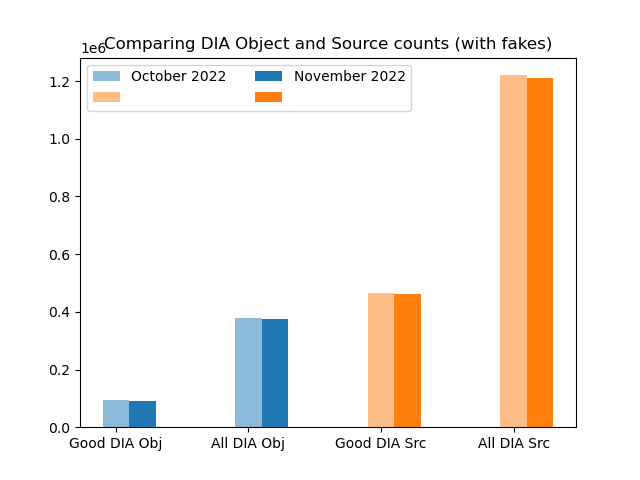

In [34]:
srcTable1 = srcTable_old
goodSrc1 = goodSrc_old
objTable1 = objTable_old
goodObj1 = goodObj_old
label1 = f"{month_old} {year_old}"

srcTable2 = srcTable
goodSrc2 = goodSrc
objTable2 = objTable
goodObj2 = goodObj
label2 = f"{month} {year}"

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# Previous Run
ax.bar(xbar, [len(goodObj1), len(objTable1)], 
       width, label=label1, color='C0', alpha=0.5)
ax.bar(xbar + 2, [len(goodSrc1), len(srcTable1)],
       width, label=' ', color='C1', alpha=0.5)

# Current Run
ax.bar(xbar + width, [len(goodObj2), len(objTable2)], 
       width, label=label2, color='C0')
ax.bar(xbar + 2 + width, [len(goodSrc2), len(srcTable2)],
       width, label=' ', color='C1')

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title('Comparing DIA Object and Source counts (with fakes)')

## 4. Fakes completeness analysis

In [35]:
def completenessByBandPlot(matchedDiaSources, bandList, colorList, flux_col_suffix='_mag', doRaDecCut=False):

    completeness_byband = {}
    completeness_err_byband = {}
    bins = np.linspace(20, 26, 70)
    
    # Some filters
    wScienceOnly = matchedDiaSources['isVisitSource'] & ~matchedDiaSources['isTemplateSource']
    wMatched = matchedDiaSources['diaSourceId'] > 0
    
    if doRaDecCut:
        # Spatial cut  # probably redundant now that we do RA/Dec cut in trimFakes
        minra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].min()
        maxra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].max()
        mindecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].min()
        maxdecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].max()
        wRADec = (matchedDiaSources.ra < maxra) & (matchedDiaSources.ra > minra) & \
                 (matchedDiaSources.decl > mindecl) & (matchedDiaSources.decl < maxdecl)

    for band in bandList:
        wband = matchedDiaSources['filterName'] == band

        if doRaDecCut:
            matched_filter = (wMatched & wScienceOnly & wRADec & wband)
            unmatched_filter = (~wMatched & wScienceOnly & wRADec & wband)
        else:
            matched_filter = (wMatched & wScienceOnly &  wband)
            unmatched_filter = (~wMatched & wScienceOnly & wband)

        n_matched, edges = np.histogram(matchedDiaSources.loc[matched_filter, f'{band}{flux_col_suffix}'], bins=bins)
        n_unmatched, edges = np.histogram(matchedDiaSources.loc[unmatched_filter, f'{band}{flux_col_suffix}'], bins=bins)

        ntot = n_matched + n_unmatched
        nmatched_err = np.sqrt(n_matched)
        completeness_byband[band] = n_matched/ntot

        # Attempt to compute some kind of error
        ntot_err = np.sqrt(ntot) # compute on total to keep Poisson errors in gaussian regime
        completeness_err_byband[band] = completeness_byband[band] * \
                                        np.sqrt((nmatched_err/n_matched)**2. + (ntot_err/ntot)**2.)
    
    plt.figure()
    plt.title('Spatial distribution of matched DIA Sources')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & wMatched,'decl'],
                marker='x', s=3, label='Matched science fake')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & ~wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & ~wMatched,'decl'],
                marker='.', s=3, label='Unmatched science fake')
    plt.legend()
    
    if len(bandList) > 1:
        fig, axs = plt.subplots(3, 2, figsize=(9, 12))
        axG = axs[0, 0]
        axR = axs[0, 1]
        axI = axs[1, 0]
        axZ = axs[1, 1]
        axY = axs[2, 0]
        ax0 = axs[2, 1]
        ax0.axis('off')
        axList = [axG, axR, axI, axZ, axY]
        colorList = ['C2', 'C1', 'C3', 'C5', 'k']
        xlim = (20,26)
        ylim = (0, 1)
        plt.setp(axs, xlim=xlim, ylim=ylim)
        fig.suptitle(f'Completeness')
        for ax, band, color in zip(axList, bandList, colorList):
            ax.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color)
    
    plt.figure(figsize=(8, 6))
    for band, color in zip(bandList, colorList):
        plt.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color, label=band)
    plt.axhline(.9, ls='--', color='0.75')#, label='90%')
    plt.legend(loc='lower left')
    plt.xlabel('Injected magnitude')
    plt.ylabel('Fractional completeness')
    plt.title('Completeness for sources injected into science (visit) images')

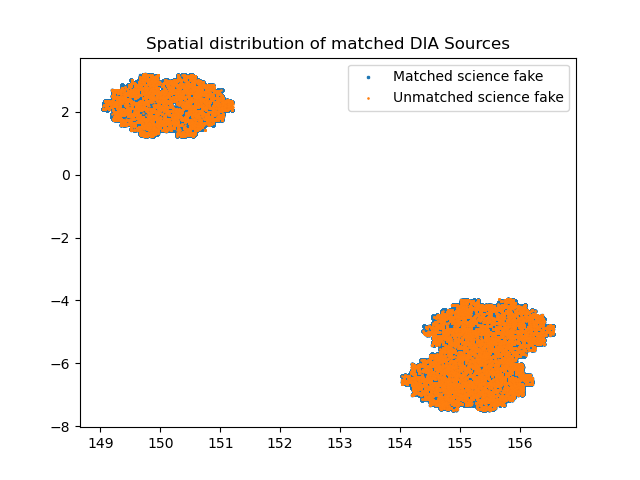

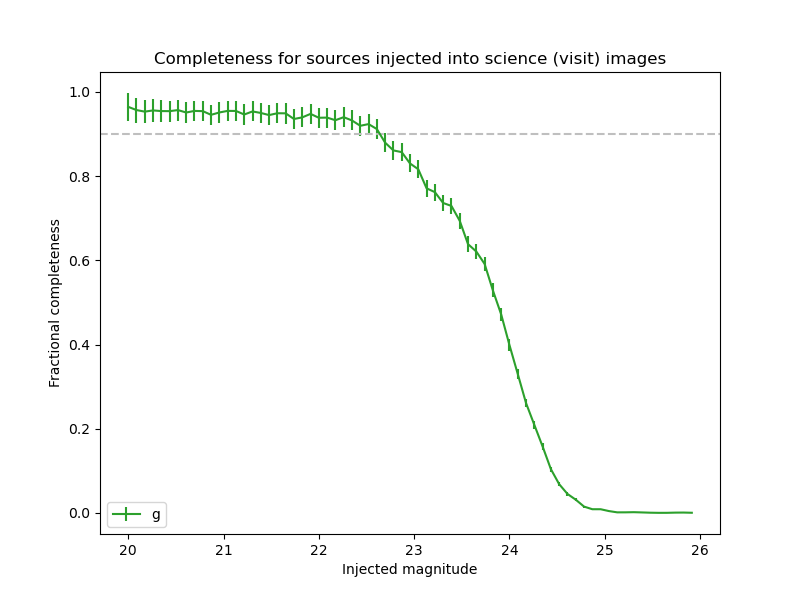

In [36]:
bandList = ['g']
colorList = ['C2']

completenessByBandPlot(matchedDiaSources, bandList, colorList,
                       flux_col_suffix='_mag', doRaDecCut=False)

## 5. SNR distributions

For both difference image fluxes (psFlux) and forced source photometry fluxes (totFlux)
SNR is basically just flux/fluxErr for our purposes... but there is now an actual `snr` column in the DiaSource table too, even better!

In [37]:
srcTable.columns

Index(['diaSourceId', 'diaObjectId', 'ra', 'decl', 'ccdVisitId', 'midPointTai',
       'apFlux', 'psFlux', 'apFluxErr', 'psFluxErr', 'totFlux', 'totFluxErr',
       'x', 'y', 'snr', 'ixxPSF', 'iyyPSF', 'ixyPSF', 'flags', 'filterName',
       'visit', 'detector', 'instrument'],
      dtype='object')

Text(0.5, 0, 'SNR of DIA Sources')

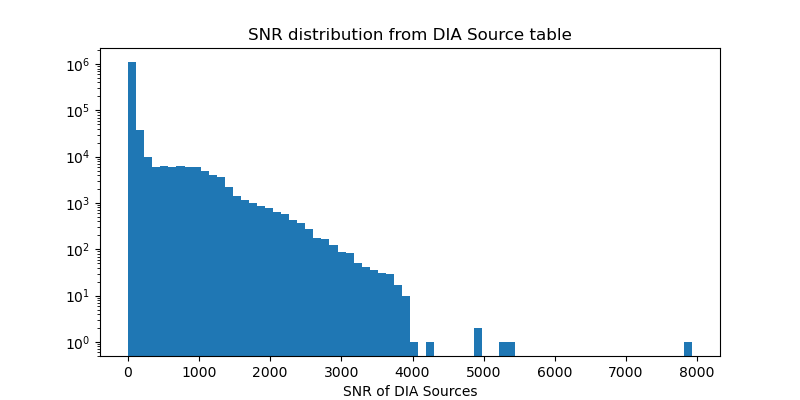

In [38]:
plt.figure(figsize=(8,4))
plt.yscale('log')
snrHist = plt.hist(srcTable.snr, bins=70)
plt.title('SNR distribution from DIA Source table')
plt.xlabel('SNR of DIA Sources')

In [39]:
# Pre-snr column:
srcTable['psFluxSNR'] = srcTable.psFlux / srcTable.psFluxErr
srcTable['totFluxSNR'] = srcTable.totFlux / srcTable.totFluxErr

Text(0.5, 0, 'psFlux/psFluxErr')

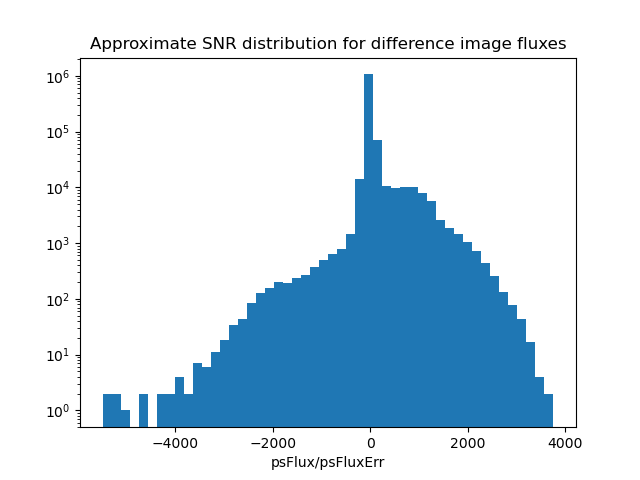

In [40]:
plt.figure()
plt.yscale('log')
psFluxHist = plt.hist(srcTable.psFluxSNR, bins=50)
plt.title('Approximate SNR distribution for difference image fluxes')
plt.xlabel('psFlux/psFluxErr')

Text(0.5, 0, 'totFlux/totFluxErr')

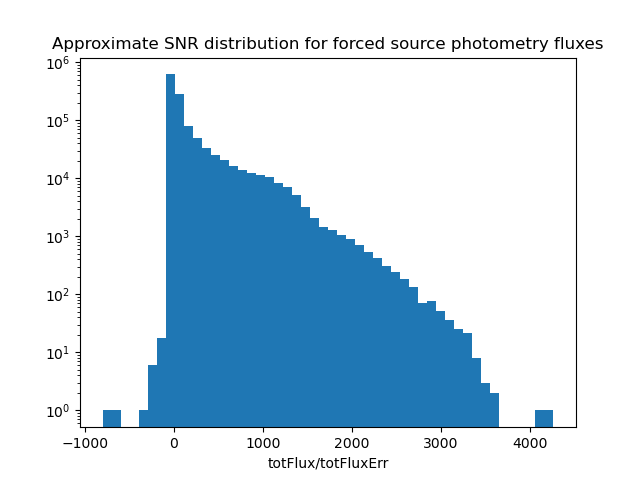

In [41]:
plt.figure()
plt.yscale('log')
totFluxHist = plt.hist(srcTable.totFluxSNR, bins=50)
plt.title('Approximate SNR distribution for forced source photometry fluxes')
plt.xlabel('totFlux/totFluxErr')